In [2]:
!nvidia-smi

Mon Oct  2 23:47:49 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 536.67                 Driver Version: 536.67       CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 2060      WDDM  | 00000000:01:00.0  On |                  N/A |
|  0%   48C    P8              11W / 170W |   1015MiB /  6144MiB |      2%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from tensorflow.keras import *
from tensorflow.keras.layers import *
from tensorflow.keras import Input, Model

In [3]:
""" def predict_and_visualize_images(model_filename, image_folder, num_images=5):
    # 加载模型
    model = tf.keras.models.load_model(model_filename)

    # 列出文件夹中的所有图像文件
    image_files = [os.path.join(image_folder, filename) for filename in os.listdir(image_folder) if filename.endswith('.png')]

    # 随机选择指定数量的图像
    selected_images = random.sample(image_files, num_images)

    for image_path in selected_images:
        # 读取原始图像和ground truth
        original_image = Image.open(image_path)
        ground_truth_path = os.path.join('dataset_old/test_mask', os.path.basename(image_path))
        ground_truth_image = Image.open(ground_truth_path)

        # 预测
        image = original_image.convert('L')  # 将图像转换为灰度图像
        image_array = np.array(image)  # 将PIL图像转换为NumPy数组
        image_array = np.expand_dims(image_array, axis=0)

        predictions = model.predict(image_array)
        output_image = (predictions[0] * 255).astype(np.uint8)

        # 提取图像文件名（不带路径）
        image_filename = os.path.basename(image_path)

        # 保存输出图像为文件，以图像文件名命名
        #output_filename = f'unet_{image_filename}'
        #cv2.imwrite(output_filename, output_image)

        # 显示原始图像、ground truth和预测结果图像
        plt.figure(figsize=(18, 6))

        plt.subplot(1, 3, 1)
        plt.imshow(original_image, cmap='gray')  # 显示原始图像
        plt.title('Original Image', fontsize=14)

        plt.subplot(1, 3, 2)
        plt.imshow(ground_truth_image, cmap='gray')  # 显示ground truth
        plt.title('Ground Truth', fontsize=14)

        plt.subplot(1, 3, 3)
        plt.imshow(output_image, cmap='gray')  # 显示预测图像
        plt.title('Predicted Image', fontsize=14)
        plt.suptitle(image_filename, fontsize=16)
        plt.show() """

" def predict_and_visualize_images(model_filename, image_folder, num_images=5):\n    # 加载模型\n    model = tf.keras.models.load_model(model_filename)\n\n    # 列出文件夹中的所有图像文件\n    image_files = [os.path.join(image_folder, filename) for filename in os.listdir(image_folder) if filename.endswith('.png')]\n\n    # 随机选择指定数量的图像\n    selected_images = random.sample(image_files, num_images)\n\n    for image_path in selected_images:\n        # 读取原始图像和ground truth\n        original_image = Image.open(image_path)\n        ground_truth_path = os.path.join('dataset_old/test_mask', os.path.basename(image_path))\n        ground_truth_image = Image.open(ground_truth_path)\n\n        # 预测\n        image = original_image.convert('L')  # 将图像转换为灰度图像\n        image_array = np.array(image)  # 将PIL图像转换为NumPy数组\n        image_array = np.expand_dims(image_array, axis=0)\n\n        predictions = model.predict(image_array)\n        output_image = (predictions[0] * 255).astype(np.uint8)\n\n        # 提取图像文件名（不带路径）\n  

In [4]:
import os
import random
import numpy as np
import tensorflow as tf
from PIL import Image
import cv2
import matplotlib.pyplot as plt

def predict_and_visualize_images(model_filename, image_folder, label_folder, num_images=5, target_size=(448, 448)):
    # 加载模型
    model = tf.keras.models.load_model(model_filename)

    # 列出文件夹中的所有图像文件
    image_files = [os.path.join(image_folder, filename) for filename in os.listdir(image_folder) if filename.endswith('.png')]

    # 随机选择指定数量的图像
    selected_images = random.sample(image_files, num_images)

    for image_path in selected_images:
        # 读取原始图像和ground truth
        original_image = Image.open(image_path)
        ground_truth_path = os.path.join(label_folder, os.path.basename(image_path))  # 使用 ground_truth_folder 参数
        ground_truth_image = Image.open(ground_truth_path)

        # 调整图像大小为指定的目标大小
        input_image = original_image.resize(target_size)
        ground_truth_image = ground_truth_image.resize(target_size)

        input_image_array = np.array(input_image)  # 将PIL图像转换为NumPy数组
        ground_truth_array = np.array(ground_truth_image)  # 将PIL图像转换为NumPy数组
        input_image_array = np.expand_dims(input_image_array, axis=-1)  # 添加通道维度
        ground_truth_array = np.expand_dims(ground_truth_array, axis=-1)  # 添加通道维度

        # 预测
        predictions = model.predict(np.expand_dims(input_image_array, axis=0))
        output_image = (predictions[0] * 255).astype(np.uint8)

        # 提取图像文件名（不带路径）
        image_filename = os.path.basename(image_path)

        # 保存输出图像为文件，以图像文件名命名
        #output_filename = f'unet_{image_filename}'
        #cv2.imwrite(output_filename, output_image)

        # 显示原始图像、ground truth和预测结果图像
        plt.figure(figsize=(18, 6))

        plt.subplot(1, 3, 1)
        plt.imshow(input_image, cmap='gray')  # 显示原始图像
        plt.title('Original Image', fontsize=14)

        plt.subplot(1, 3, 2)
        plt.imshow(ground_truth_image, cmap='gray')  # 显示ground truth
        plt.title('Ground Truth', fontsize=14)

        plt.subplot(1, 3, 3)
        plt.imshow(output_image, cmap='gray')  # 显示预测图像
        plt.title('Predicted Image', fontsize=14)
        plt.suptitle(image_filename, fontsize=16)
        plt.show()


In [5]:
def unet(input_shape):
    inputs = Input(img_size)

    # Encoder
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    # Bottleneck
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(conv5)
    drop5 = Dropout(0.5)(conv5)

    # Decoder
    up6 = Conv2D(512, 2, activation='relu', padding='same')(UpSampling2D(size=(2, 2))(drop5))
    merge6 = concatenate([drop4, up6], axis=3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(merge6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(conv6)

    up7 = Conv2D(256, 2, activation='relu', padding='same')(UpSampling2D(size=(2, 2))(conv6))
    merge7 = concatenate([conv3, up7], axis=3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(merge7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(conv7)

    up8 = Conv2D(128, 2, activation='relu', padding='same')(UpSampling2D(size=(2, 2))(conv7))
    merge8 = concatenate([conv2, up8], axis=3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(merge8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(conv8)

    up9 = Conv2D(64, 2, activation='relu', padding='same')(UpSampling2D(size=(2, 2))(conv8))
    merge9 = concatenate([conv1, up9], axis=3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(merge9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(conv9)
    conv9 = Conv2D(2, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    # Output
    outputs = Conv2D(1, 1, activation='sigmoid')(conv9)
    model = Model(inputs=inputs, outputs=outputs)
    model.summary()
    
    return model

input_shape=448
img_size = (input_shape, input_shape, 1)
model = unet(img_size)

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 448, 448, 1) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 448, 448, 64) 640         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 448, 448, 64) 36928       conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 224, 224, 64) 0           conv2d_1[0][0]                   
______________________________________________________________________________________________

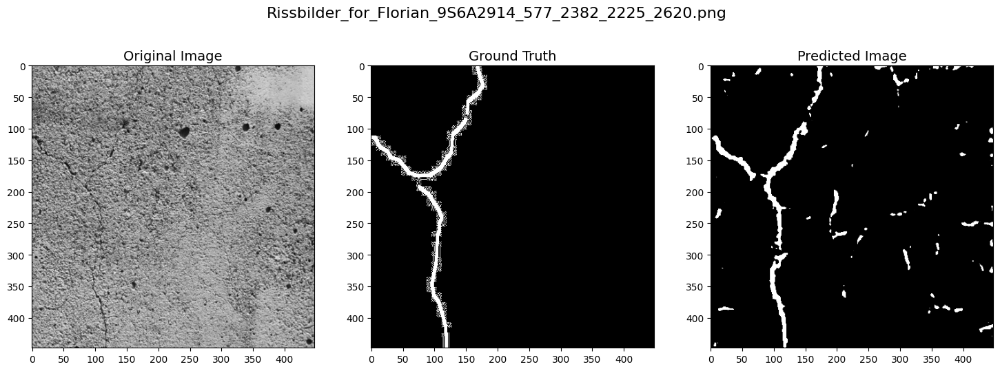

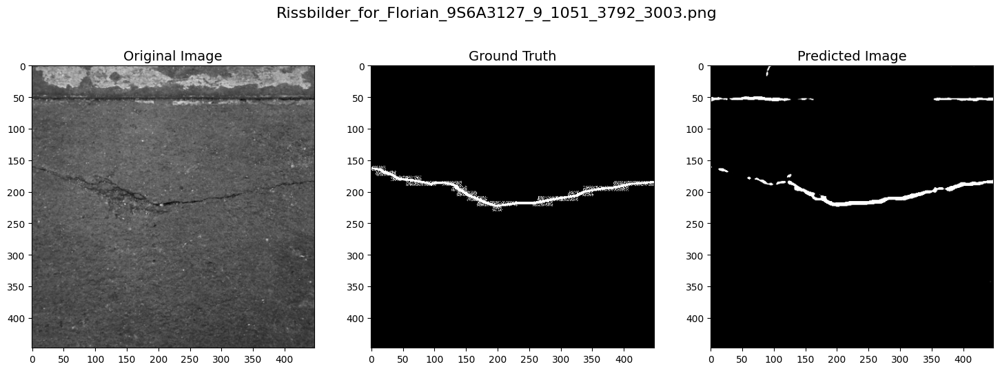

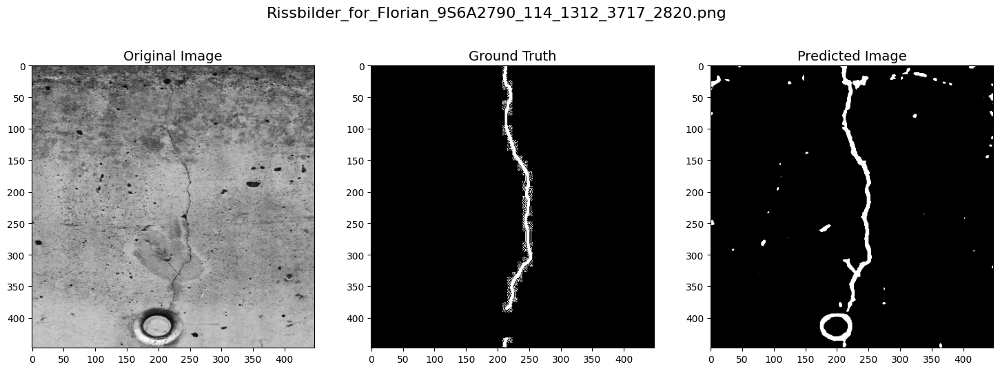

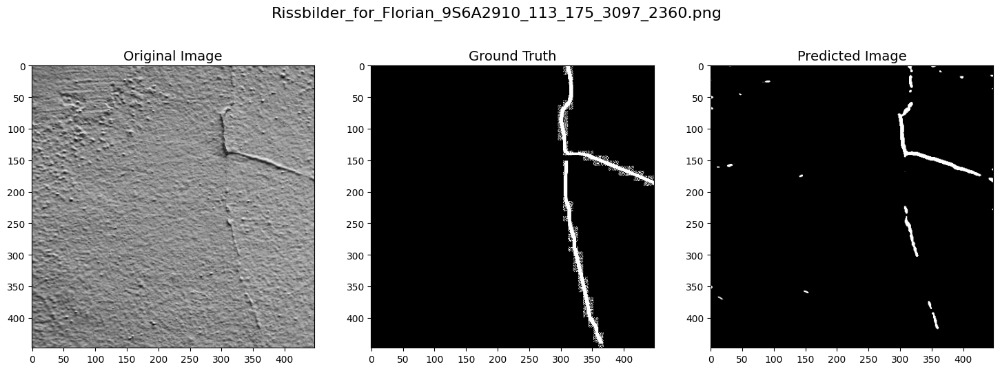

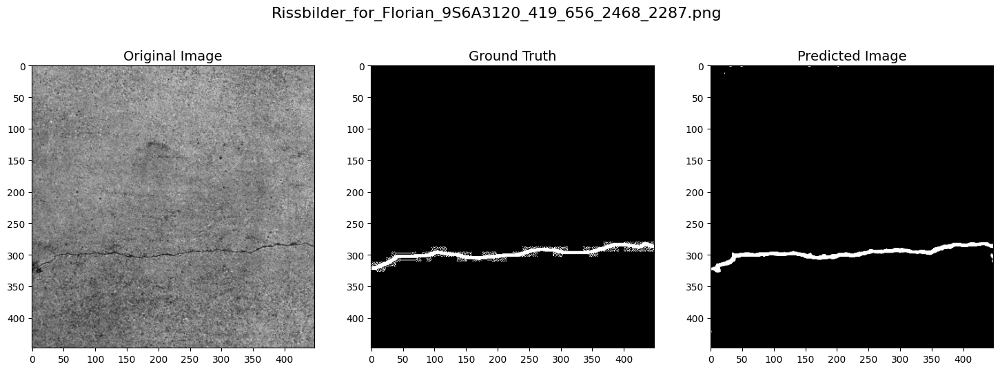

In [6]:
model_filename = r'd:\Users\ru83m\Desktop\model\Rissbilder_model.h5'
image_folder = 'test'
label_folder ="test_mask"
num_images = 5
predict_and_visualize_images(model_filename, image_folder,label_folder, num_images)

In [8]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, jaccard_score

def predict_and_visualize_images(model_filename, image_folder, label_folder, num_images=5, target_size=(448, 448)):
    # 加载模型
    model = tf.keras.models.load_model(model_filename)

    # 列出文件夹中的所有图像文件
    image_files = [os.path.join(image_folder, filename) for filename in os.listdir(image_folder) if filename.endswith('.png')]

    # 随机选择指定数量的图像
    selected_images = random.sample(image_files, num_images)
    # 创建一个列表来存储所有预测的标签和所有真实的标签
    all_predictions = []
    all_ground_truths = []
    
    for image_path in selected_images:
        # ...您的现有代码...
        original_image = Image.open(image_path)
        ground_truth_path = os.path.join(label_folder, os.path.basename(image_path))  # 使用 ground_truth_folder 参数
        ground_truth_image = Image.open(ground_truth_path)
        # 调整图像大小为指定的目标大小
        input_image = original_image.resize(target_size)
        ground_truth_image = ground_truth_image.resize(target_size)
        input_image_array = np.array(input_image)  # 将PIL图像转换为NumPy数组
        ground_truth_array = np.array(ground_truth_image)  # 将PIL图像转换为NumPy数组
        input_image_array = np.expand_dims(input_image_array, axis=-1)  # 添加通道维度
        ground_truth_array = np.expand_dims(ground_truth_array, axis=-1)  # 添加通道维度
        # 预测
        predictions = model.predict(np.expand_dims(input_image_array, axis=0))
        output_image = (predictions[0] * 255).astype(np.uint8)
        # 提取图像文件名（不带路径）
        #image_filename = os.path.basename(image_path)
        # 保存输出图像为文件，以图像文件名命名
        #output_filename = f'unet_{image_filename}'
        #cv2.imwrite(output_filename, output_image)
        # 显示原始图像、ground truth和预测结果图像
        plt.figure(figsize=(18, 6))
        plt.subplot(1, 3, 1)
        plt.imshow(input_image, cmap='gray')  # 显示原始图像
        plt.title('Original Image', fontsize=14)
        plt.subplot(1, 3, 2)
        plt.imshow(ground_truth_image, cmap='gray')  # 显示ground truth
        plt.title('Ground Truth', fontsize=14)
        plt.subplot(1, 3, 3)
        plt.imshow(output_image, cmap='gray')  # 显示预测图像
        plt.title('Predicted Image', fontsize=14)
        plt.suptitle(image_filename, fontsize=16)
        plt.show()
    
    
    
        
    
        # 计算预测
        predictions = model.predict(np.expand_dims(input_image_array, axis=0))
        output_image = (predictions[0] * 255).astype(np.uint8)
    
        # 提取图像文件名（不带路径）
        #image_filename = os.path.basename(image_path)
    
        # 将预测结果和ground truth 添加到列表中
        all_predictions.append(predictions)
        all_ground_truths.append(ground_truth_array)
    
    # 将列表转换为NumPy数组
    all_predictions = np.array(all_predictions)
    all_ground_truths = np.array(all_ground_truths)
    
    # 将预测结果和ground truth 转换为二进制（0和1），可以使用适当的阈值来确定类别
    threshold = 0.5  # 根据模型的输出范围来选择适当的阈值
    
    binary_predictions = (all_predictions > threshold).astype(np.uint8)
    binary_ground_truths = (all_ground_truths > 0.5).astype(np.uint8)
    
    # 计算混淆矩阵
    confusion_mat = confusion_matrix(binary_ground_truths.flatten(), binary_predictions.flatten())
    
    print("Confusion Matrix:")
    print(confusion_mat)
    confusion_mat = confusion_matrix(binary_ground_truths.flatten(), binary_predictions.flatten())

    # 计算其他性能指标
    accuracy = accuracy_score(binary_ground_truths.flatten(), binary_predictions.flatten())
    sensitivity = recall_score(binary_ground_truths.flatten(), binary_predictions.flatten())
    #specificity = specificity_score(binary_ground_truths.flatten(), binary_predictions.flatten())  # 此处需要实现 specificity_score 函数
    precision_metric = precision_score(binary_ground_truths.flatten(), binary_predictions.flatten())
    #f1_score = f1_score(binary_ground_truths.flatten(), binary_predictions.flatten())
    jaccard_similarity = jaccard_score(binary_ground_truths.flatten(), binary_predictions.flatten())
    #dice_coefficient = dice_score(binary_ground_truths.flatten(), binary_predictions.flatten())
    
    print("Confusion Matrix:")
    print(confusion_mat)
    
    print("Accuracy: {:.4f}".format(accuracy))
    print("Sensitivity (Recall): {:.4f}".format(sensitivity))
    #print("Specificity: {:.4f}".format(specificity))
    print("Precision: {:.4f}".format(precision_metric))
    #print("F1 Score: {:.4f}".format(f1_score))
    print("Jaccard Similarity: {:.4f}".format(jaccard_similarity))
    #print("Dice Coefficient: {:.4f}".format(dice_coefficient))

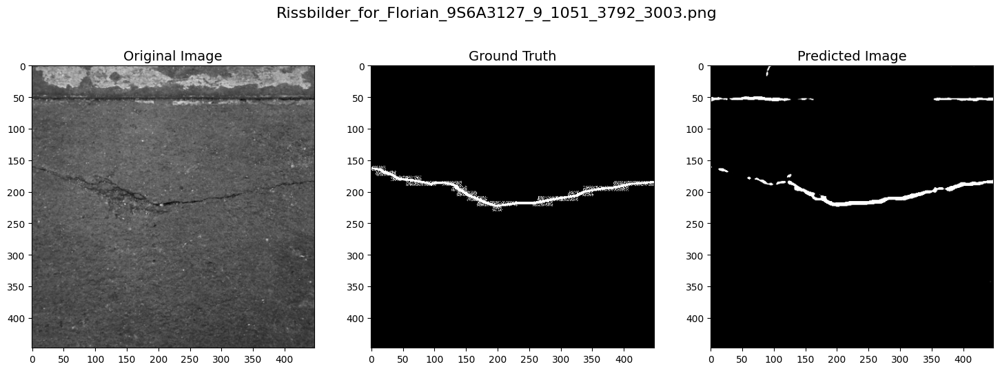

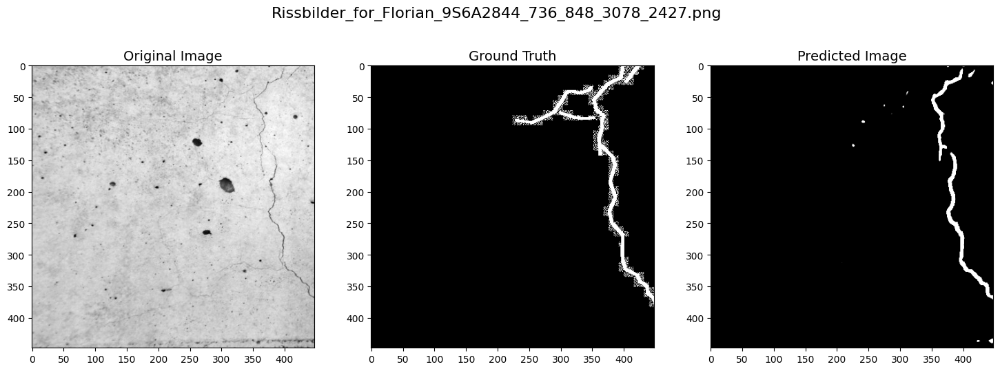

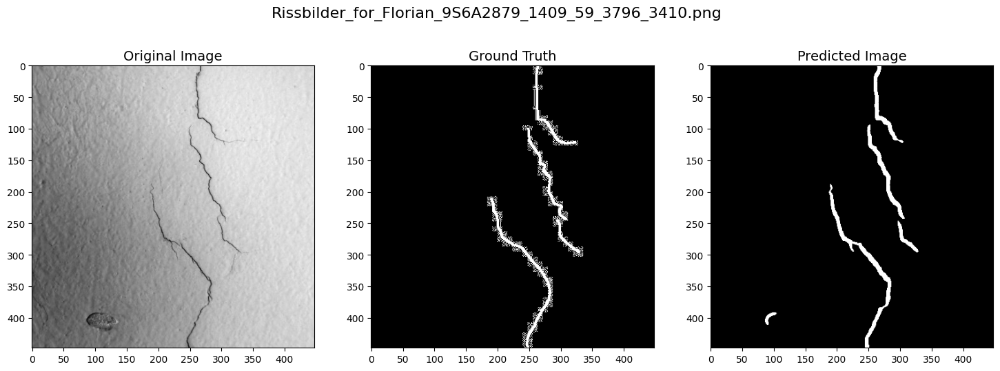

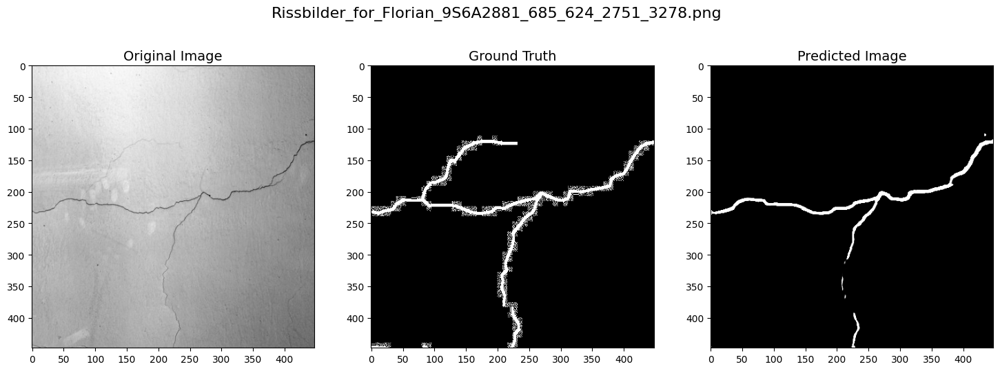

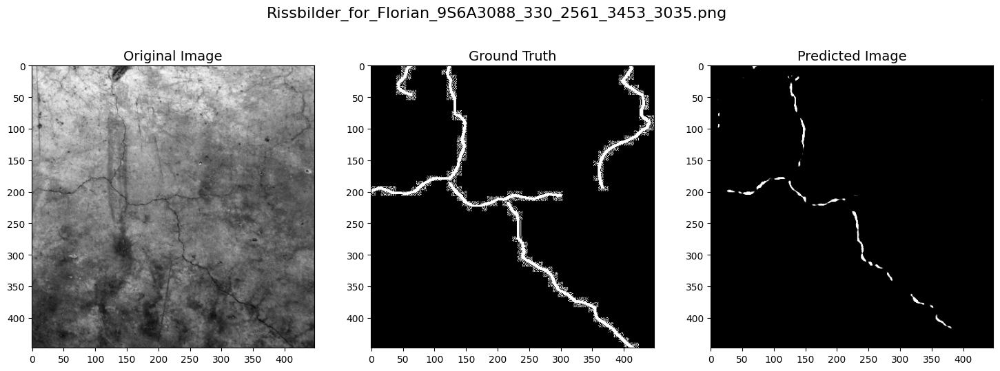

Confusion Matrix:
[[960431   2917]
 [ 28429  11743]]
Confusion Matrix:
[[960431   2917]
 [ 28429  11743]]
Accuracy: 0.9688
Sensitivity (Recall): 0.2923
Precision: 0.8010
Jaccard Similarity: 0.2725


In [9]:
predict_and_visualize_images(model_filename, image_folder,label_folder, num_images)

In [30]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, jaccard_score

def evaluate_model_with_folders(model, image_folder, label_folder, threshold=0.7,target_size=(448,448)):
    all_predictions = []
    all_ground_truths = []

    image_files = [os.path.join(image_folder, filename) for filename in os.listdir(image_folder) if filename.endswith('.png')]

    for image_path in image_files:
        ground_truth_path = os.path.join(label_folder, os.path.basename(image_path))

        # 读取原始图像和ground truth
        original_image = Image.open(image_path)
        ground_truth_image = Image.open(ground_truth_path)

        # 调整图像大小为指定的目标大小
        input_image = original_image.resize(target_size)
        ground_truth_image = ground_truth_image.resize(target_size)

        input_image_array = np.array(input_image)  # 将PIL图像转换为NumPy数组
        ground_truth_array = np.array(ground_truth_image)  # 将PIL图像转换为NumPy数组
        input_image_array = np.expand_dims(input_image_array, axis=-1)  # 添加通道维度
        ground_truth_array = np.expand_dims(ground_truth_array, axis=-1)  # 添加通道维度

        # 预测
        predictions = model.predict(np.expand_dims(input_image_array, axis=0))
        predictions_binary = (predictions > threshold).astype(np.uint8)

    
        # 将预测结果和ground truth 添加到列表中
        all_predictions.append(predictions_binary)
        all_ground_truths.append(ground_truth_array)

    # 将列表转换为NumPy数组
    all_predictions = np.array(all_predictions)
    all_ground_truths = np.array(all_ground_truths)

    # 计算混淆矩阵
    confusion_mat = confusion_matrix(all_ground_truths.flatten(), all_predictions.flatten())

    # 计算其他性能指标
    accuracy = accuracy_score(all_ground_truths.flatten(), all_predictions.flatten())
    recall_metric = recall_score(all_ground_truths.flatten(), all_predictions.flatten(), average='micro')
    precision_metric = precision_score(all_ground_truths.flatten(), all_predictions.flatten(), average='micro')
    f1_metric = f1_score(all_ground_truths.flatten(), all_predictions.flatten(), average='micro')

    jaccard_similarity = jaccard_score(all_ground_truths.flatten(), all_predictions.flatten(),average=None)

    return confusion_mat, accuracy, recall_metric, precision_metric, f1_metric, jaccard_similarity

image_folder= r"D:\Users\user\Desktop\dataset\test5"
label_folder=r"D:\Users\user\Desktop\dataset\test5_mask"
confusion_mat, accuracy, recall_metric, precision_metric, f1_metric, jaccard_similarity = evaluate_model_with_folders(model, image_folder, label_folder)

print("Confusion Matrix:")
print(confusion_mat)
print("Accuracy: {:.4f}".format(accuracy))
print("Sensitivity (Recall): {:.4f}".format(recall_metric))
print("Precision: {:.4f}".format(precision_metric))
print("F1 Score: {:.4f}".format(f1_metric))
print("Jaccard Similarity: {:.4f}".format(jaccard_similarity))




Confusion Matrix:
[[975673      0      0      0      0      0      0      0      0      0
       0      0      0      0      0      0      0      0]
 [  6295      0      0      0      0      0      0      0      0      0
       0      0      0      0      0      0      0      0]
 [  3846      0      0      0      0      0      0      0      0      0
       0      0      0      0      0      0      0      0]
 [  1770      0      0      0      0      0      0      0      0      0
       0      0      0      0      0      0      0      0]
 [   775      0      0      0      0      0      0      0      0      0
       0      0      0      0      0      0      0      0]
 [   293      0      0      0      0      0      0      0      0      0
       0      0      0      0      0      0      0      0]
 [    55      0      0      0      0      0      0      0      0      0
       0      0      0      0      0      0      0      0]
 [    34      0      0      0      0      0      0      0      0 

TypeError: unsupported format string passed to numpy.ndarray.__format__

In [16]:
import os
import numpy as np
from PIL import Image
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score, f1_score, jaccard_score

def evaluate_model_with_folders(model, image_folder, label_folder, threshold=0.7, target_size=(448, 448)):
    all_predictions = []
    all_ground_truths = []

    image_files = [os.path.join(image_folder, filename) for filename in os.listdir(image_folder) if filename.endswith('.png')]

    for image_path in image_files:
        ground_truth_path = os.path.join(label_folder, os.path.basename(image_path))

        # 读取原始图像和ground truth
        original_image = Image.open(image_path)
        ground_truth_image = Image.open(ground_truth_path)

        # 调整图像大小为指定的目标大小
        input_image = original_image.resize(target_size)
        ground_truth_image = ground_truth_image.resize(target_size)

        input_image_array = np.array(input_image)  # 将PIL图像转换为NumPy数组
        ground_truth_array = np.array(ground_truth_image)  # 将PIL图像转换为NumPy数组
        input_image_array = np.expand_dims(input_image_array, axis=-1)  # 添加通道维度
        ground_truth_array = np.expand_dims(ground_truth_array, axis=-1)  # 添加通道维度

        # 预测
        predictions = model.predict(np.expand_dims(input_image_array, axis=0))
        predictions_binary = (predictions > threshold).astype(np.uint8)

        # 将预测结果和ground truth 添加到列表中
        all_predictions.append(predictions_binary)
        all_ground_truths.append(ground_truth_array)

    # 将列表转换为NumPy数组
    all_predictions = np.array(all_predictions)
    all_ground_truths = np.array(all_ground_truths)

    # 修改混淆矩阵的计算，仅针对二元分类问题
    binary_predictions = all_predictions.flatten()
    binary_ground_truths = all_ground_truths.flatten()

    confusion_mat = confusion_matrix(binary_ground_truths, binary_predictions)

    # 计算其他性能指标
    accuracy = accuracy_score(binary_ground_truths, binary_predictions)
    recall_metric = recall_score(binary_ground_truths, binary_predictions)
    precision_metric = precision_score(binary_ground_truths, binary_predictions)
    f1_metric = f1_score(binary_ground_truths, binary_predictions)
    jaccard_similarity = jaccard_score(binary_ground_truths, binary_predictions)

    return confusion_mat, accuracy, recall_metric, precision_metric, f1_metric, jaccard_similarity

# 使用您的图像文件夹和标签文件夹
image_folder = "test"
label_folder = "test_mask"

# 调用评估函数
confusion_mat, accuracy, recall_metric, precision_metric, f1_metric, jaccard_similarity = evaluate_model_with_folders(model_filename, image_folder, label_folder)

print("Confusion Matrix:")
print(confusion_mat)
print("Accuracy: {:.4f}".format(accuracy))
print("Sensitivity (Recall): {:.4f}".format(recall_metric))
print("Precision: {:.4f}".format(precision_metric))
print("F1 Score: {:.4f}".format(f1_metric))
print("Jaccard Similarity: {:.4f}".format(jaccard_similarity))


AttributeError: 'str' object has no attribute 'predict'

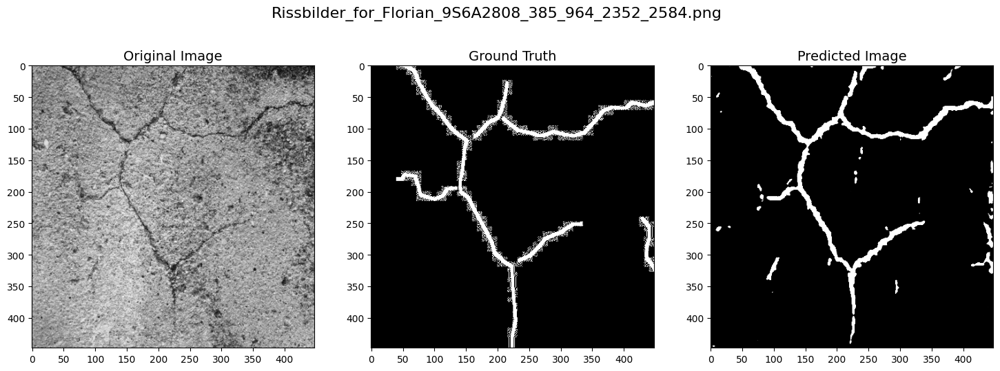

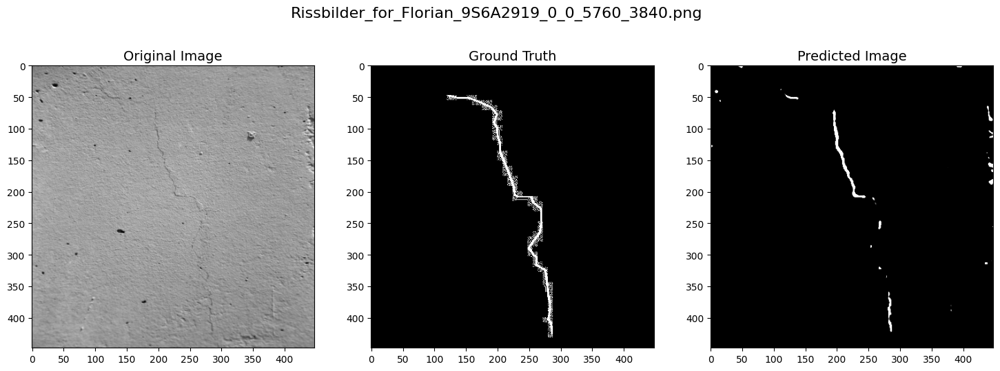

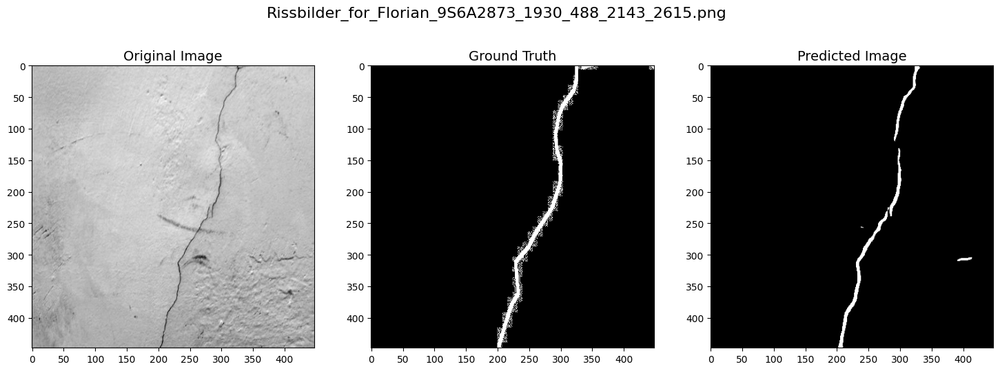

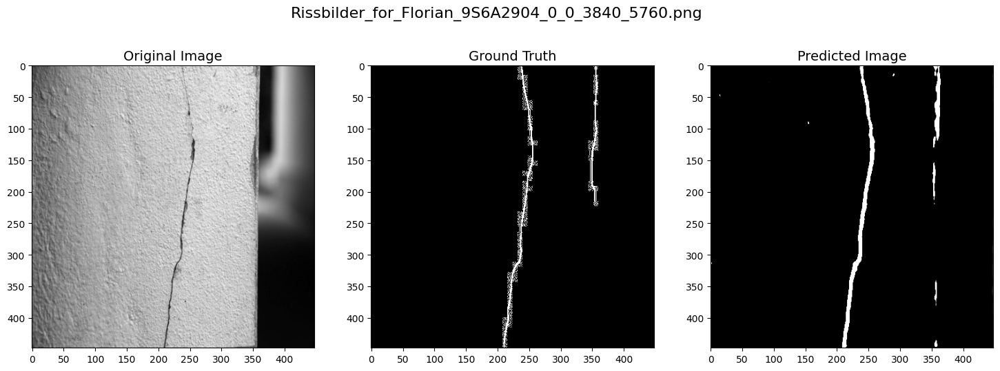

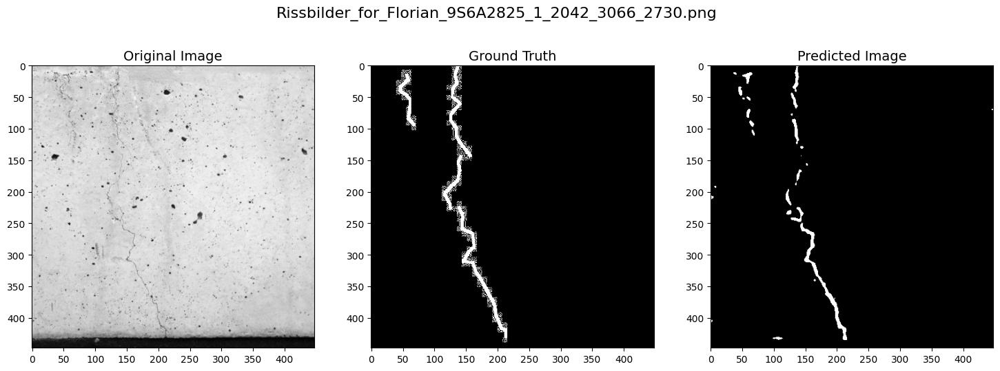

Confusion Matrix for Image 1: 
[[183514   3106]
 [  6582   7502]]
Confusion Matrix for Image 2: 
[[196308    472]
 [  3136    788]]
Confusion Matrix for Image 3: 
[[194937    309]
 [  3444   2014]]
Confusion Matrix for Image 4: 
[[194845   1527]
 [  2028   2304]]
Confusion Matrix for Image 5: 
[[193708    447]
 [  4581   1968]]
Metrics for Image 1: 
Accuracy: 0.9517
Sensitivity (Recall): 0.7072
Precision: 0.5327
Jaccard Similarity: 0.4364
Metrics for Image 2: 
Accuracy: 0.9820
Sensitivity (Recall): 0.6254
Precision: 0.2008
Jaccard Similarity: 0.1793
Metrics for Image 3: 
Accuracy: 0.9813
Sensitivity (Recall): 0.8670
Precision: 0.3690
Jaccard Similarity: 0.3492
Metrics for Image 4: 
Accuracy: 0.9823
Sensitivity (Recall): 0.6014
Precision: 0.5319
Jaccard Similarity: 0.3932
Metrics for Image 5: 
Accuracy: 0.9749
Sensitivity (Recall): 0.8149
Precision: 0.3005
Jaccard Similarity: 0.2813


In [40]:
import os
import random
import numpy as np
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score, jaccard_score

def predict_image(model, image_path, label_folder, target_size=(448, 448), threshold=0.5):
    original_image = Image.open(image_path)
    ground_truth_path = os.path.join(label_folder, os.path.basename(image_path))
    ground_truth_image = Image.open(ground_truth_path)

    input_image = original_image.resize(target_size)
    ground_truth_image = ground_truth_image.resize(target_size)

    input_image_array = np.array(input_image)
    ground_truth_array = np.array(ground_truth_image)

    input_image_array = np.expand_dims(input_image_array, axis=-1)
    ground_truth_array = np.expand_dims(ground_truth_array, axis=-1)

    predictions = model.predict(np.expand_dims(input_image_array, axis=0))
    output_image = (predictions[0] * 255).astype(np.uint8)

    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(input_image, cmap='gray')
    plt.title('Original Image', fontsize=14)
    plt.subplot(1, 3, 2)
    plt.imshow(ground_truth_image, cmap='gray')
    plt.title('Ground Truth', fontsize=14)
    plt.subplot(1, 3, 3)
    plt.imshow(output_image, cmap='gray')
    plt.title('Predicted Image', fontsize=14)
    plt.suptitle(os.path.basename(image_path), fontsize=16)
    plt.show()

    return predictions, ground_truth_array

def predict_and_visualize_images(model_filename, image_folder, label_folder, num_images=5, target_size=(448, 448)):
    # 加载模型
    model = tf.keras.models.load_model(model_filename)

    # 列出文件夹中的所有图像文件
    image_files = [os.path.join(image_folder, filename) for filename in os.listdir(image_folder) if filename.endswith('.png')]

    # 随机选择指定数量的图像
    selected_images = random.sample(image_files, num_images)

    # 创建两个列表来存储所有预测的标签和所有真实的标签
    all_predictions = []
    all_ground_truths = []
    
    for image_path in selected_images:
        predictions, ground_truth = predict_image(model, image_path, label_folder, target_size=target_size)
        all_predictions.append(predictions)
        all_ground_truths.append(ground_truth)
    
    return all_predictions, all_ground_truths


def compute_confusion_metrics(all_predictions, all_ground_truths, threshold=0.5):
    all_binary_predictions = [(predictions > threshold).astype(np.uint8) for predictions in all_predictions]
    all_binary_ground_truths = [(ground_truth > 0.5).astype(np.uint8) for ground_truth in all_ground_truths]

    confusion_matrices = [confusion_matrix(binary_ground_truths.flatten(), binary_predictions.flatten()) for binary_predictions, binary_ground_truths in zip(all_binary_predictions, all_binary_ground_truths)]

    for i, confusion_mat in enumerate(confusion_matrices):
        print("Confusion Matrix for Image {}: ".format(i + 1))
        print(confusion_mat)

    accuracies = [accuracy_score(binary_ground_truths.flatten(), binary_predictions.flatten()) for binary_predictions, binary_ground_truths in zip(all_binary_predictions, all_binary_ground_truths)]
    precisions = [precision_score(binary_ground_truths.flatten(), binary_predictions.flatten()) for binary_predictions, binary_ground_truths in zip(all_binary_predictions, all_binary_ground_truths)]
    recall = [recall_score(binary_ground_truths.flatten(), binary_predictions.flatten()) for binary_predictions, binary_ground_truths in zip(all_binary_predictions, all_binary_ground_truths)]
    jaccard_similarities = [jaccard_score(binary_ground_truths.flatten(), binary_predictions.flatten()) for binary_predictions, binary_ground_truths in zip(all_binary_predictions, all_binary_ground_truths)]

    for i, (accuracy, precisions,recall, jaccard_similarity) in enumerate(zip(accuracies, precisions,recall, jaccard_similarities)):
        print("Metrics for Image {}: ".format(i + 1))
        print("Accuracy: {:.4f}".format(accuracy))
        print("Sensitivity (Recall): {:.4f}".format(precisions))
        print("Precision: {:.4f}".format(recall))
        print("Jaccard Similarity: {:.4f}".format(jaccard_similarity))


# 使用示例
model = r'd:\Users\ru83m\Desktop\model\Rissbilder_model.h5'
predictions, ground_truths=predict_and_visualize_images(model_filename, image_folder,label_folder, num_images)
compute_confusion_metrics(predictions, ground_truths, threshold=0.5)

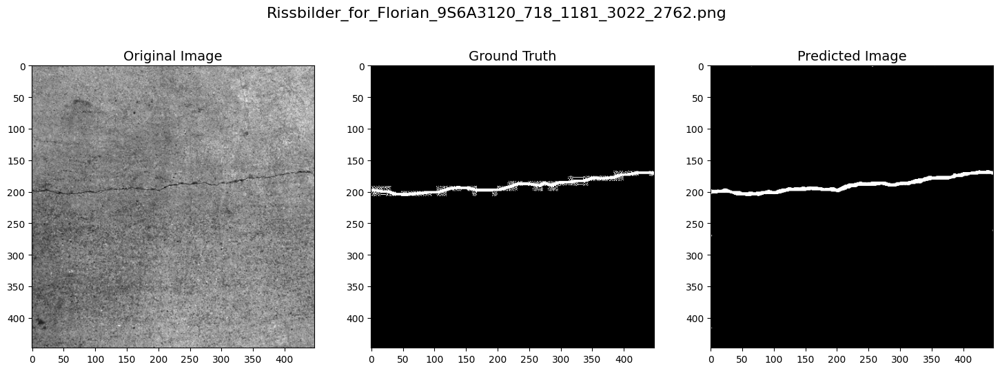

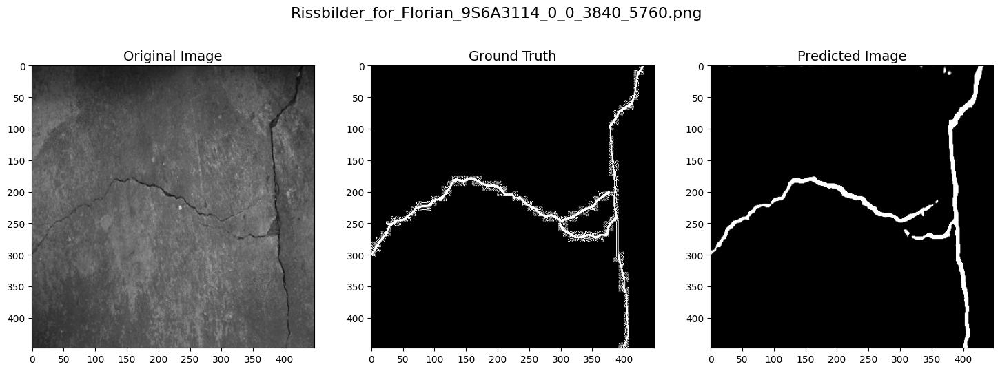

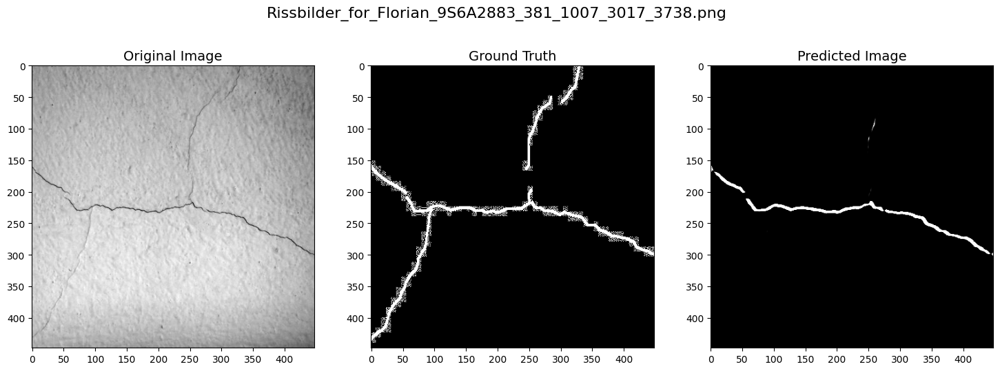

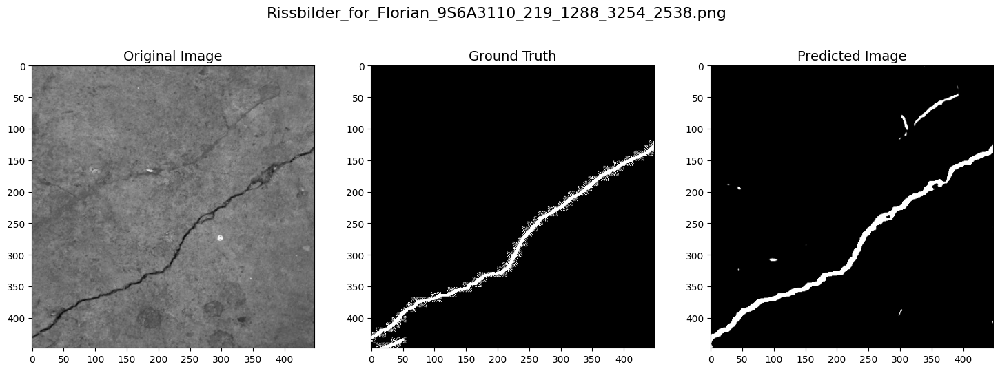

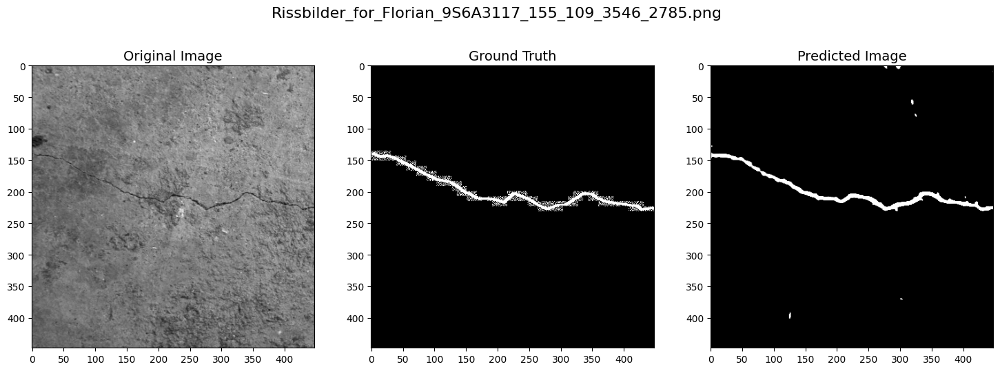

In [39]:
import os
import numpy as np
import tensorflow as tf
from PIL import Image
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score, jaccard_score
import random

def predict_image(model, image_path, label_folder, target_size=(448, 448)):
    # 预测单张图像的代码保持不变
        original_image = Image.open(image_path)
        ground_truth_path = os.path.join(label_folder, os.path.basename(image_path))
        ground_truth_image = Image.open(ground_truth_path)

        input_image = original_image.resize(target_size)
        ground_truth_image = ground_truth_image.resize(target_size)

        input_image_array = np.array(input_image)
        ground_truth_array = np.array(ground_truth_image)

        input_image_array = np.expand_dims(input_image_array, axis=-1)
        ground_truth_array = np.expand_dims(ground_truth_array, axis=-1)

        predictions = model.predict(np.expand_dims(input_image_array, axis=0))
        output_image = (predictions[0] * 255).astype(np.uint8)
        # 提取图像文件名（不带路径）
        image_filename = os.path.basename(image_path)

        # 保存输出图像为文件，以图像文件名命名
        #output_filename = f'unet_{image_filename}'
        #cv2.imwrite(output_filename, output_image)

        plt.figure(figsize=(18, 6))
        plt.subplot(1, 3, 1)
        plt.imshow(input_image, cmap='gray')  # 显示原始图像
        plt.title('Original Image', fontsize=14)
        plt.subplot(1, 3, 2)
        plt.imshow(ground_truth_image, cmap='gray')  # 显示ground truth
        plt.title('Ground Truth', fontsize=14)
        plt.subplot(1, 3, 3)
        plt.imshow(output_image, cmap='gray')  # 显示预测图像
        plt.title('Predicted Image', fontsize=14)
        plt.suptitle(image_filename, fontsize=16)
        plt.show()

        return predictions, ground_truth_array

def compute_confusion_metrics(predictions, ground_truths, threshold=0.5):
    binary_predictions = (predictions > threshold).astype(np.uint8)
    binary_ground_truths = (ground_truths > 0.5).astype(np.uint8)

    confusion_mat = confusion_matrix(binary_ground_truths.flatten(), binary_predictions.flatten())

    print("Confusion Matrix:")
    print(confusion_mat)

    accuracy = accuracy_score(binary_ground_truths.flatten(), binary_predictions.flatten())
    precision_metric = precision_score(binary_ground_truths.flatten(), binary_predictions.flatten())
    recall = recall_score(binary_ground_truths.flatten(), binary_predictions.flatten())
    jaccard_similarity = jaccard_score(binary_ground_truths.flatten(), binary_predictions.flatten())

    print("Accuracy: {:.4f}".format(accuracy))
    print("Precision: {:.4f}".format(precision_metric))
    print("Recall: {:.4f}".format(recall))
    print("Jaccard Similarity: {:.4f}".format(jaccard_similarity))

def main():
    # 加载模型
    model_filename = r'd:\Users\ru83m\Desktop\model\Rissbilder_model.h5'
    model = tf.keras.models.load_model(model_filename)

    # 获取测试图像文件列表
    test_image_folder = 'test'
    label_folder = 'test_mask'
    test_image_files = [os.path.join(test_image_folder, filename) for filename in os.listdir(test_image_folder) if filename.endswith('.png')]

    # 初始化列表来存储所有预测和真实标签
    all_predictions = []
    all_ground_truths = []


    
    # 选择特定的五张图像进行预测和可视化
    num_images_to_visualize = 5
    selected_images = random.sample(test_image_files, num_images_to_visualize)

    for image_path in selected_images:
        predictions, ground_truth = predict_image(model, image_path, label_folder)
        all_predictions.append(predictions)
        all_ground_truths.append(ground_truth)
        
        # 在每次迭代中计算混淆矩阵和性能指标

    # 将列表转换为NumPy数组
    all_predictions = np.array(all_predictions)
    all_ground_truths = np.array(all_ground_truths)
    

    

if __name__ == "__main__":
    main()


In [25]:
import os
import numpy as np
import tensorflow as tf
from PIL import Image
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score, jaccard_score
import random

def predict_image(model, image_folder, label_folder, target_size=(448, 448), num_predictions=1):
    # 预测单张图像的代码保持不变
    image_path = [os.path.join(image_folder, filename) for filename in os.listdir(image_folder) if filename.endswith('.png')]

    original_image = Image.open(image_path)
    ground_truth_path = os.path.join(label_folder, os.path.basename(image_path))
    ground_truth_image = Image.open(ground_truth_path)

    input_image = original_image.resize(target_size)
    ground_truth_image = ground_truth_image.resize(target_size)

    input_image_array = np.array(input_image)
    ground_truth_array = np.array(ground_truth_image)

    input_image_array = np.expand_dims(input_image_array, axis=-1)
    ground_truth_array = np.expand_dims(ground_truth_array, axis=-1)

    predictions = model.predict(np.expand_dims(input_image_array, axis=0))
    output_image = (predictions[0] * 255).astype(np.uint8)
    # 提取图像文件名（不带路径）
    image_filename = os.path.basename(image_path)

    # 保存输出图像为文件，以图像文件名命名
    #output_filename = f'unet_{image_filename}'
    #cv2.imwrite(output_filename, output_image)

    for i in range(num_predictions):
        predictions = model.predict(np.expand_dims(input_image_array, axis=0))
        output_image = (predictions[0] * 255).astype(np.uint8)
        
        plt.figure(figsize=(18, 6))
        plt.subplot(1, 3, 1)
        plt.imshow(input_image, cmap='gray')  # Show original image
        plt.title('Original Image', fontsize=14)
        plt.subplot(1, 3, 2)
        plt.imshow(ground_truth_image, cmap='gray')  # Show ground truth
        plt.title('Ground Truth', fontsize=14)
        plt.subplot(1, 3, 3)
        plt.imshow(output_image, cmap='gray')  # Show predicted image
        plt.title(f'Predicted Image {i+1}', fontsize=14)  # Add index to title
        plt.suptitle(image_filename, fontsize=16)
        plt.show()

    return predictions, ground_truth_array

def compute_confusion_metrics(predictions, ground_truths, threshold=0.5):
    binary_predictions = (predictions > threshold).astype(np.uint8)
    binary_ground_truths = (ground_truths > 0.5).astype(np.uint8)

    confusion_mat = confusion_matrix(binary_ground_truths.flatten(), binary_predictions.flatten())

    print("Confusion Matrix:")
    print(confusion_mat)

    accuracy = accuracy_score(binary_ground_truths.flatten(), binary_predictions.flatten())
    precision_metric = precision_score(binary_ground_truths.flatten(), binary_predictions.flatten())
    recall = recall_score(binary_ground_truths.flatten(), binary_predictions.flatten())
    jaccard_similarity = jaccard_score(binary_ground_truths.flatten(), binary_predictions.flatten())

    print("Accuracy: {:.4f}".format(accuracy))
    print("Precision: {:.4f}".format(precision_metric))
    print("Recall: {:.4f}".format(recall))
    print("Jaccard Similarity: {:.4f}".format(jaccard_similarity))
# """ 
# """ def main():
#     # 加载模型
#     model_filename = r'd:\Users\ru83m\Desktop\model\Rissbilder_model.h5'
#     model = tf.keras.models.load_model(model_filename)

#     # 获取测试图像文件列表
#     test_image_folder = 'test'
#     label_folder = 'test_mask'
#     test_image_files = [os.path.join(test_image_folder, filename) for filename in os.listdir(test_image_folder) if filename.endswith('.png')]

#     # 初始化列表来存储所有预测和真实标签
#     all_predictions = []
#     all_ground_truths = []

#     # 选择特定的五张图像进行预测和可视化
#     num_images_to_visualize = 5
#     selected_images = random.sample(test_image_files, num_images_to_visualize)

#     for image_path in selected_images:
#         predictions, ground_truth = predict_image(model, image_path, label_folder)
#         all_predictions.append(predictions)
#         all_ground_truths.append(ground_truth)

#     # 将列表转换为NumPy数组
#     all_predictions = np.array(all_predictions)
#     all_ground_truths = np.array(all_ground_truths)
    
#     # 计算混淆矩阵和性能指标
#     compute_confusion_metrics(all_predictions, all_ground_truths, threshold=0.5)

# if __name__ == "__main__":
#     main()
#  """ """

In [27]:
predict_image(model, "test", 'test_mask', num_predictions=3)

AttributeError: 'list' object has no attribute 'read'

In [22]:
def predict_and_visualize_images(model_filename, image_folder, label_folder, num_images=5, traget_size=(448, 448)):
    # 加载模型
    model = tf.keras.models.load_model(model_filename)

    # 列出文件夹中的所有图像文件
    image_files = [os.path.join(image_folder, filename) for filename in os.listdir(image_folder) if filename.endswith('.png')]

    # 随机选择指定数量的图像
    selected_images = random.sample(image_files, num_images)

    for image_path in selected_images:
        # 读取原始图像和ground truth
        original_image = Image.open(image_path)
        ground_truth_path = os.path.join(label_folder, os.path.basename(image_path))  # 使用 ground_truth_folder 参数
        ground_truth_image = Image.open(ground_truth_path)

        # 调整图像大小
        original_image = original_image.resize(traget_size)
        ground_truth_image = ground_truth_image.resize(traget_size)

        input_image_array = np.array(original_image)
        ground_truth_array = np.array(ground_truth_image)

        input_image_array = np.expand_dims(input_image_array, axis=-1)
        ground_truth_array = np.expand_dims(ground_truth_array, axis=-1)

        predictions = model.predict(np.expand_dims(input_image_array, axis=0))
        output_image = (predictions[0] * 255).astype(np.uint8)
        

        # 提取图像文件名（不带路径）
        image_filename = os.path.basename(image_path)

        # 显示原始图像、ground truth和预测结果图像
        plt.figure(figsize=(18, 6))

        plt.subplot(1, 3, 1)
        plt.imshow(original_image, cmap='gray')  # 显示原始图像
        plt.title('Original Image', fontsize=14)

        plt.subplot(1, 3, 2)
        plt.imshow(ground_truth_image, cmap='gray')  # 显示ground truth
        plt.title('Ground Truth', fontsize=14)

        plt.subplot(1, 3, 3)
        plt.imshow(output_image, cmap='gray')  # 显示预测图像
        plt.title('Predicted Image', fontsize=14)
        plt.suptitle(image_filename, fontsize=16)
        plt.show()


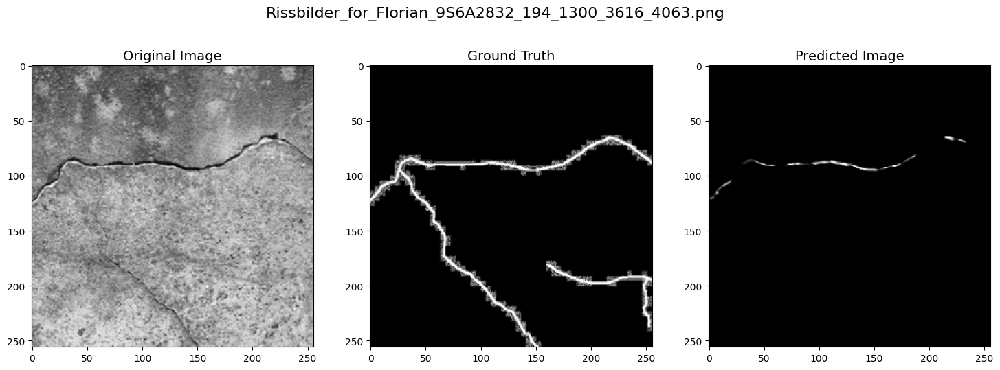

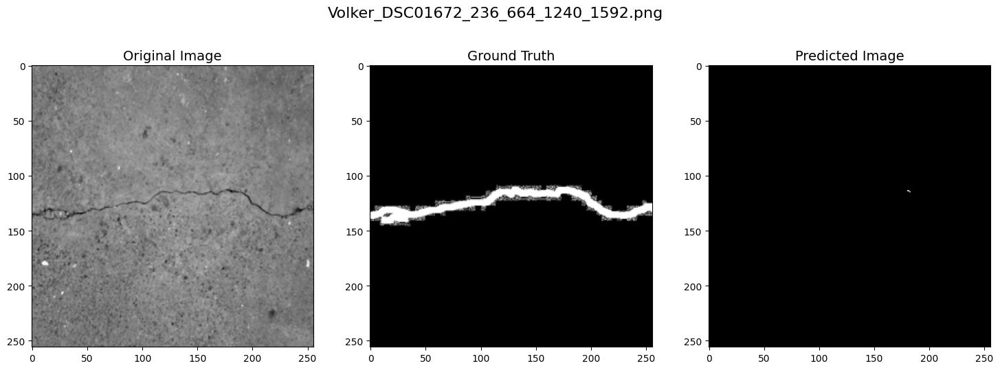

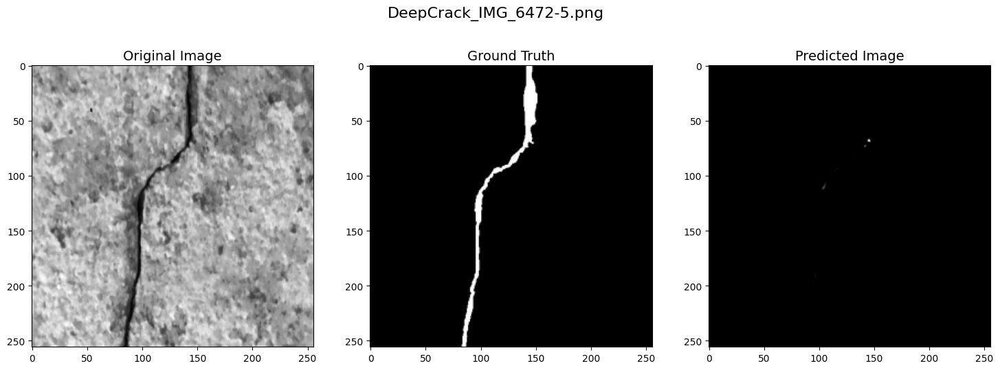

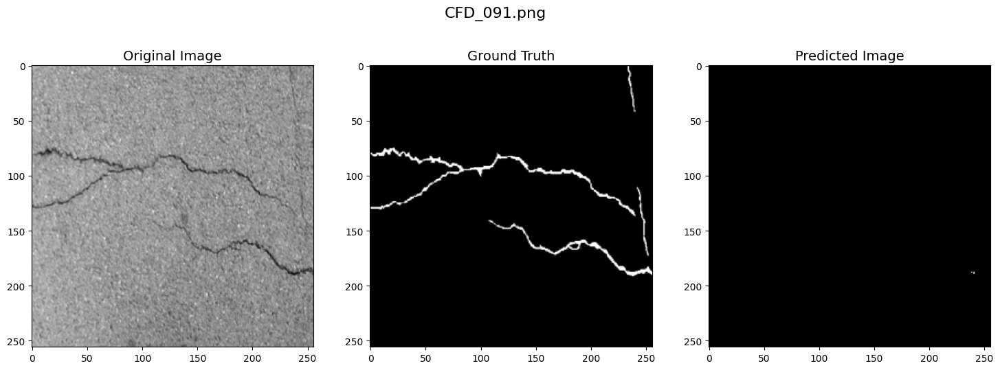

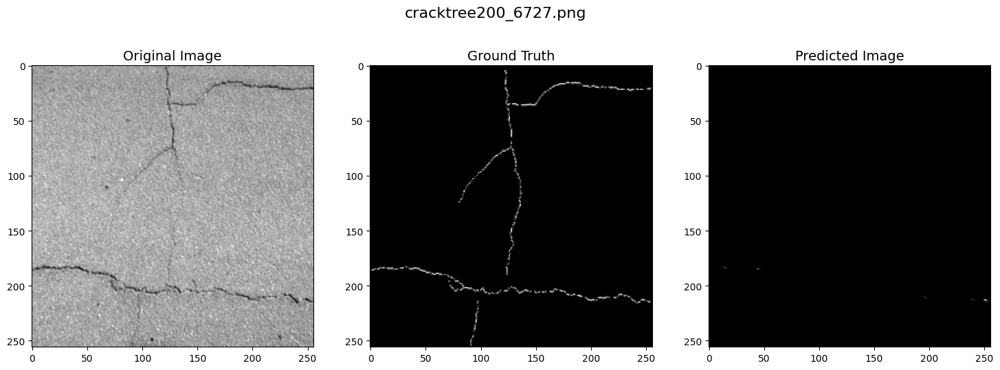

In [26]:
model = r'D:\Users\ru83m\Desktop\Rissbilder5\RissbilderPRELU_model.h5'
image_folder = 'test5'
label_folder = 'test5_mask'
#predictions, ground_truth = predict_image(model,image_folder, label_folder, num_images=5)
predict_and_visualize_images(model,image_folder, label_folder, num_images=5,traget_size=(256, 256))

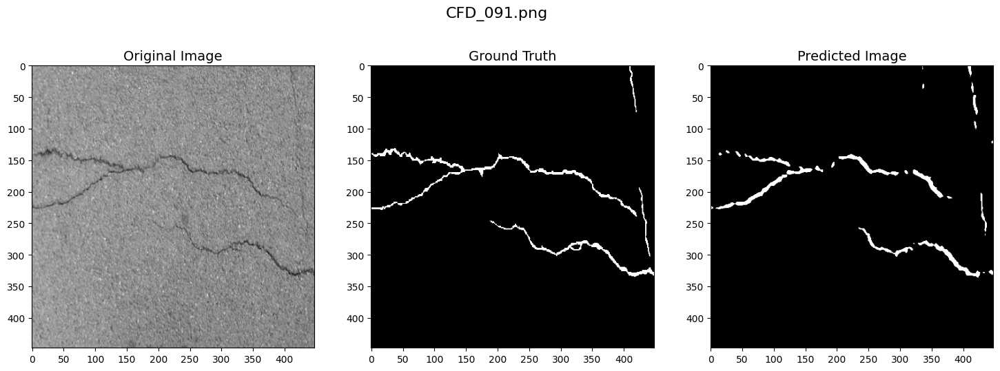

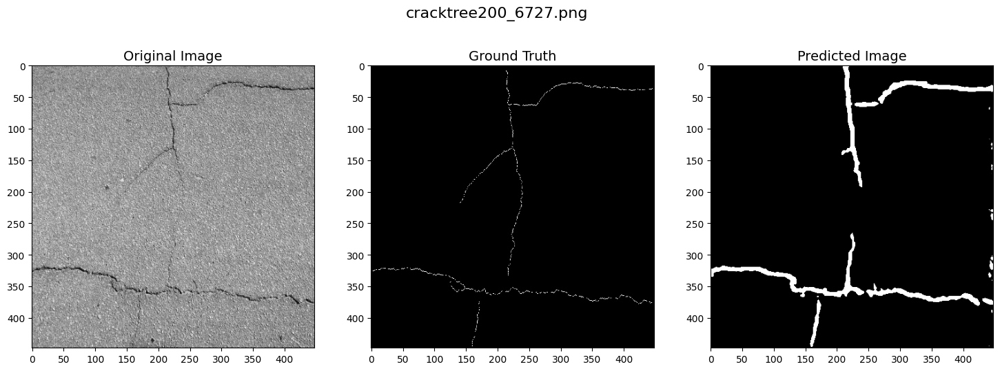

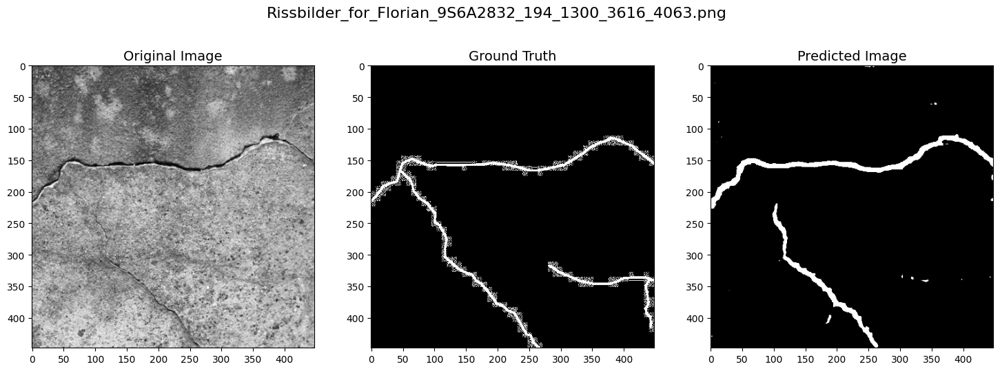

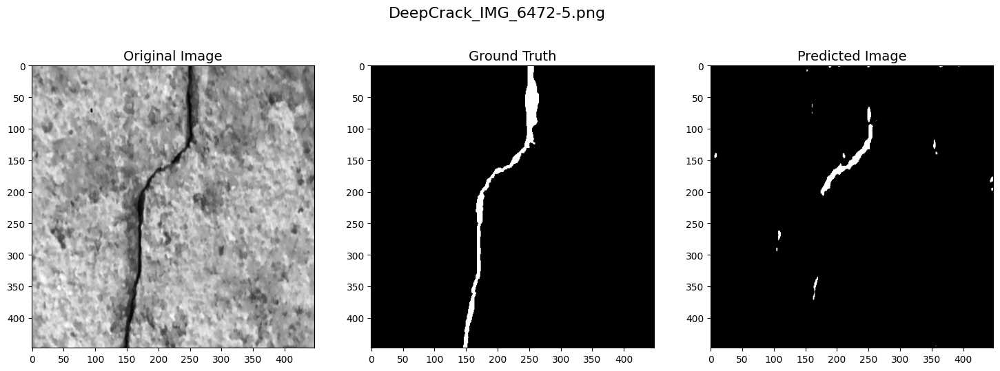

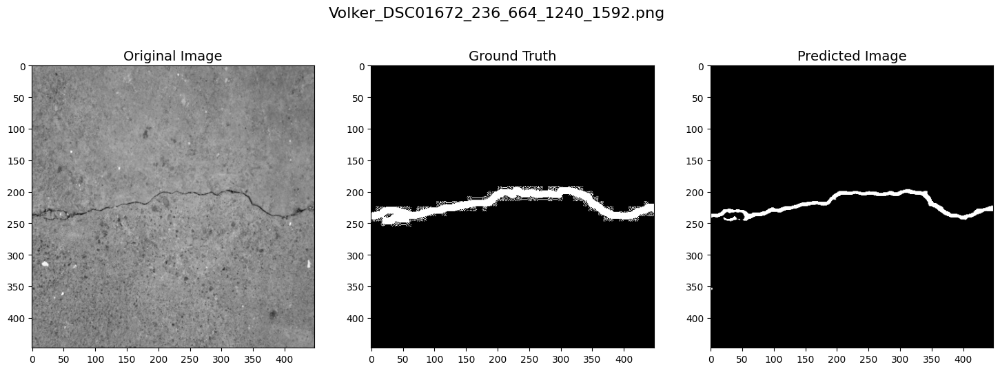

In [20]:
model = r'd:\Users\ru83m\Desktop\model\Rissbilder_model.h5'
image_folder = 'test5'
label_folder = 'test5_mask'
#predictions, ground_truth = predict_image(model,image_folder, label_folder, num_images=5)
predict_and_visualize_images(model,image_folder, label_folder, num_images=5,traget_size=(448, 448))

In [15]:
import os
import numpy as np
import tensorflow as tf
from PIL import Image
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score, jaccard_score

def predict_image(model, image_path, label_folder, target_size=(256, 256)):
        original_image = Image.open(image_path)
        ground_truth_path = os.path.join(label_folder, os.path.basename(image_path))
        ground_truth_image = Image.open(ground_truth_path)

        input_image = original_image.resize(target_size)
        ground_truth_image = ground_truth_image.resize(target_size)

        input_image_array = np.array(input_image)
        ground_truth_array = np.array(ground_truth_image)

        input_image_array = np.expand_dims(input_image_array, axis=-1)
        ground_truth_array = np.expand_dims(ground_truth_array, axis=-1)

        predictions = model.predict(np.expand_dims(input_image_array, axis=0))
        

        return predictions, ground_truth_array

def compute_confusion_metrics(predictions, ground_truths, threshold=0.5):
    binary_predictions = (predictions > threshold).astype(np.uint8)
    binary_ground_truths = (ground_truths > 0.5).astype(np.uint8)

    confusion_mat = confusion_matrix(binary_ground_truths.flatten(), binary_predictions.flatten())

    print("Confusion Matrix:")
    print(confusion_mat)

    accuracy = accuracy_score(binary_ground_truths.flatten(), binary_predictions.flatten())
    precision_metric = precision_score(binary_ground_truths.flatten(), binary_predictions.flatten())
    recall = recall_score(binary_ground_truths.flatten(), binary_predictions.flatten())
    jaccard_similarity = jaccard_score(binary_ground_truths.flatten(), binary_predictions.flatten())

    print("Accuracy: {:.4f}".format(accuracy))
    print("Precision: {:.4f}".format(precision_metric))
    print("Recall: {:.4f}".format(recall))
    print("Jaccard Similarity: {:.4f}".format(jaccard_similarity))

def main():
    # 加载模型
    model = tf.keras.models.load_model(model_filename)

    # 获取测试图像文件列表
    test_image_files = [os.path.join(image_folder, filename) for filename in os.listdir(image_folder) if filename.endswith('.png')]

    # 初始化列表来存储所有预测和真实标签
    all_predictions = []
    all_ground_truths = []
    
    # 遍历所有测试图像并获取预测和真实标签
    for image_path in test_image_files:
        predictions, ground_truth = predict_image(model, image_path, label_folder)
        all_predictions.append(predictions)
        all_ground_truths.append(ground_truth)

    # 将列表转换为NumPy数组
    all_predictions = np.array(all_predictions)
    all_ground_truths = np.array(all_ground_truths)

    # 计算混淆矩阵和性能指标
    compute_confusion_metrics(all_predictions, all_ground_truths, threshold=0.5)

if __name__ == "__main__":
    model_filename = r'D:\Users\ru83m\Desktop\Rissbilder5\RissbilderPRELU40_model.h5'
    image_folder = 'test5'
    label_folder = 'test5_mask'
    main()
#predictions, ground_truth = predict_image(model,image_folder, label_folder, num_images=5)
    predict_and_visualize_images(model_filename,image_folder, label_folder, num_images=1,traget_size=(256, 256))



Confusion Matrix:
[[310676      0]
 [ 17004      0]]
Accuracy: 0.9481
Precision: 0.0000
Recall: 0.0000
Jaccard Similarity: 0.0000


c:\Users\ru83m\anaconda3\envs\unet_tf26\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


NameError: name 'predict_and_visualize_images' is not defined